## Evaluation for LLM Project

In [1]:
import pandas as pd

In [2]:
# pip install qaeval

In [3]:
!pip install nltk


In [4]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/madelinepark/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [5]:
from nltk.translate.bleu_score import sentence_bleu
from nltk.tokenize import word_tokenize

In [6]:
# Example ground truth and generated answer
reference = "Python emphasizes code readability."
candidate = "Python emphasizes code help."


In [ ]:

# Tokenizing the texts
ref_tokens = word_tokenize(reference)
cand_tokens = word_tokenize(candidate)

In [ ]:
score = sentence_bleu([ref_tokens], cand_tokens)
print("BLEU score:", score) # can scale these later 

In [ ]:
# TRY SMOOTHING FOR LONGER SCORES 
from nltk.translate.bleu_score import SmoothingFunction

# Create a SmoothingFunction object
chencherry = SmoothingFunction()

# Example usage
score = sentence_bleu([ref_tokens], cand_tokens, smoothing_function=chencherry.method1)

In [ ]:
print(score)

In [7]:
# Create a new data structure with 3 columns 
# Questions from expert QA, revisde answer string from that question, model generated summary from the json from Jay 


import json

def parse_jsonl_for_fields(file_path, fields):
    """
    Parses a JSONL file and returns dictionaries for specified fields.

    :param file_path: Path to the JSONL file.
    :param fields: List of fields to extract data for.
    :return: A dictionary where each key is a field and the value is another dictionary
             of question-answer pairs for that field.
    """
    data = {field: {} for field in fields}
    
    with open(file_path, 'r') as file:
        for line in file:
            line_data = json.loads(line)
            field = line_data.get('metadata', {}).get('field')
            question = line_data.get('question')

            for answer_key in line_data.get('answers', {}):
                revised_answer = line_data['answers'][answer_key].get('revised_answer_string')
                if field in fields and question and revised_answer:
                    data[field][question] = revised_answer
                    break # There is only one revised answer per question

            if field in fields and question and revised_answer:
                data[field][question] = revised_answer

    return data

fields_of_interest = ["Healthcare / Medicine", "Law"]
parsed_data = parse_jsonl_for_fields('expertqa.jsonl', fields_of_interest)



In [9]:
parsed_data

{'Healthcare / Medicine': {'What are signs and study findings that would indicate follicular lymphoma has transformed to diffuse large B-cell lymphoma?': 'Signs that might indicate a transformation of follicular lymphoma (FL) to diffuse large B-cell lymphoma (DLBCL) include rapid enlargement of lymph nodes, lymphoma involvement outside lymph nodes (extranodal sites), B-symptoms (fever, unintended weight loss, drenching night sweats), and sudden weakness stopping patients from working or being active [4].\nBesides these signs, elevated lactate dehydrogenase (LDH) in the blood is also a common characteristic of patients with transformed FL [4].\nIn case of suspicion of transformation, a workup including clinical examination, labs, and imaging with a positron emission tomography/computed tomography (PET/CT) is warranted [4].\n\nHowever, a biopsy remains the only reliable method to diagnose the transformation [4].\nPatients with FL presenting suspicious signs and symptoms, and/or findings 

In [10]:
print(parsed_data.keys())
medicine_parsed_data = parsed_data['Healthcare / Medicine']

dict_keys(['Healthcare / Medicine', 'Law'])


In [ ]:
medicine_parsed_data.values()

In [144]:
# medicine_parsed_data

In [13]:
import json

# Read the entire file into a single string
with open('medical_chatbot.json', 'r') as file:
    data = file.read()

# Assuming that each object is properly closed, you can use a simple regex to split them
import re
objects = re.split(r'(?<=})', data)[:-1]  # Split and remove the last empty string

# Parse each JSON object and collect into a list
parsed_data = [json.loads(obj) for obj in objects if obj.strip()]
# parsed_data
combined_dict = {}

# Loop through each dictionary in the list
for dict_item in parsed_data:
    for question, answer in dict_item.items():
        combined_dict[question] = answer

# Now `combined_dict` contains all questions as keys and answers as values
print(combined_dict)

{'What are signs and study findings that would indicate follicular lymphoma has transformed to diffuse large B-cell lymphoma?': 'Signs and study findings that would indicate follicular lymphoma has transformed to diffuse large B-cell lymphoma may include an enlarged spleen or lymph nodes, an increased number of white blood cells, and a decrease in the number of red blood cells.', 'A patient with a history of heart failure now presents with newly diagnosed metastatic HER2+ breast cancer. What is her recommended first line of treatment and what additional information should be discussed with the patient given her history of heart failure?': 'The recommended first line of treatment for metastatic HER2+ breast cancer is usually a combination of chemotherapy, targeted therapy, and hormone therapy. It is important to discuss the potential risks and benefits of each treatment option with the patient, as well as any other medications or supplements they may be taking.', 'What does research cur

In [14]:
# for each question (key) in the parsed data, find that corresponding question in test_json dict 
# then run bleu score on the revised answer string in parsed data and the value in test json dict 

metric_results = {}
for question in combined_dict.keys():
    print('QUESTION: ',question)
    ref_tokens = word_tokenize(combined_dict[question])
    cand_tokens = word_tokenize(medicine_parsed_data[question])
    
    score = sentence_bleu([ref_tokens], cand_tokens)
    print('score: ',score)

    metric_results[question]=score
    
    print('\n')

QUESTION:  What are signs and study findings that would indicate follicular lymphoma has transformed to diffuse large B-cell lymphoma?
score:  0.0391754334747657


QUESTION:  A patient with a history of heart failure now presents with newly diagnosed metastatic HER2+ breast cancer. What is her recommended first line of treatment and what additional information should be discussed with the patient given her history of heart failure?
score:  0.08365248083938898


QUESTION:  What does research currently say regarding the use of cryotherapy to prevent peripheral neuropathy in patients receiving paclitaxel?
score:  0.06260152330942378


QUESTION:  A patient with Ewing sarcoma of the femur is due for restaging scans while on VDC/IE after undergoing surgery which included the placement of hardware. Should the clinician order a CT, MRI, PET/CT or a combination of these scans? What patient factors may influence the clinician's decision?
score:  0.05392247077690135


QUESTION:  In which cases wo

/usr/local/lib/python3.9/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.9/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

 5.156482258136137e-79


QUESTION:  A counselor has a client who has come to counseling to process a particularly difficult relationship breakdown.  After numerous sessions the counsellor realises that they are counselling both people involved in the relationship breakup, thus there is a conflict of interest. What does the counselor do?
score:  1.5332777658114095e-78


QUESTION:  What are the common approaches to coping with periods of acute dis-regulation?
score:  0.061188600498344674


QUESTION:  A client who has a feeling that they have been abused in childhood, has no real memory of the abuse and struggles with emotional dis-regulation in adulthood, cannot form lasting bonds with people, is of a dissorganised attachment style, has come to therapy to work on understanding the abuse they may have experienced in childhood with the hope that this will make them better. What are the steps a therapist must take in providing a secure and safe environment for the client to begin to address

score:  3.222038834128737e-155


QUESTION:  What is the best type of epidemiological study to assess the causal association between a risk factor and a given disease?
score:  9.882709738149013e-79


QUESTION:  Is cancer curable?
score:  4.298631483271809e-155


QUESTION:  What criteria would you use to ensure safe discharge of a child with bronchiolitis?
score:  0.015688484663750585


QUESTION:  A 37-year old woman who lives alone has rheumatoid arthritis, affecting her grip. What meaningful activities might this impact and how could they be adapted?
score:  5.036327670772084e-79


QUESTION:  What are the risks of inserting a nasogastric tube during a night shift?
score:  1.4912935618251732e-78


QUESTION:  What is the best biological agent for treatment of hidradenitis suppurativa having failed adalimumab?
score:  2.528481693630674e-155


QUESTION:  An 80-year-old man is admitted for a sudden episode of aphasia and right hemiparesis. As antecedents, hypertension stands out, well contr

score:  0.012998897153182146


QUESTION:  What are the best treatment options for chest infection in patients with penicillin allergy?
score:  9.087078449262944e-79


QUESTION:  How would you approach a request to prescribe valproate in women of child bearing age?
score:  2.996742036357914e-79


QUESTION:  In the field relying on brain psychology, how do they know when the hypothesis is going to give a good result?
score:  5.868222334897075e-79


QUESTION:  The type of drug used for insomnia require prolonged use of them, can't it be solved using psychiatric scans and helmets used to read brain neurons?
score:  0.029441093008491237


QUESTION:  What are the newly invented medical interventions and treatments provided in an intensive care unit (ICU)?
score:  0.054266068770005026


QUESTION:  Many research show that Advanced Nurses Practitioners are more successful in their practice in intensive care. What is your thinking regarding the causes of this?
score:  1.0142849878283196e-78


QU

score:  0.04395922960493513


QUESTION:  What type of health supplies require approbation?
score:  1.4337445667658664e-78


QUESTION:  To what extent should there be regulations of medical devices?
score:  8.836201654230089e-79


QUESTION:  A 45-year-old woman presents to her doctor with a one-month history of fatigue, shortness of breath, and easy bruising. She has no significant past medical history. A blood test reveals anemia, leukopenia, and thrombocytopenia. A bone marrow biopsy is performed and reveals chronic myeloid leukemia (CML). The patient is referred to a hematologist-oncologist for treatment. The hematologist-oncologist discusses the treatment options with the patient, which include tyrosine kinase inhibitors (TKIs), allogeneic stem cell transplantation, and supportive care. The patient decides to undergo treatment with TKIs. What are the advantages and disadvantages of treatment with TKIs for CML?
score:  9.463030435548397e-79


QUESTION:  A 55-year-old man presents to 

In [ ]:
metric_results

In [ ]:
# MAKE A CSV 
filename = 'scaled_bleu_score_medicalchatbot.csv'


In [ ]:
# Writing to CSV
import csv
with open(filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Question', 'Scaled_Bleu_Score'])  # Writing header
    for key, value in metric_results.items():
        writer.writerow([key, value])

In [ ]:
# GRAPH ABOUT DATASET STATISTICS 

In [ ]:
law_parsed_data = parsed_data['Law']
print(len(medicine_parsed_data))
print(len(law_parsed_data))

In [ ]:
# Biomstrl code 

import json

# Read the entire file into a single string
with open('biomistral.json', 'r') as file:
    data = file.read()

# Assuming that each object is properly closed, you can use a simple regex to split them
import re
objects = re.split(r'(?<=})', data)[:-1]  # Split and remove the last empty string

# Parse each JSON object and collect into a list
parsed_data = [json.loads(obj) for obj in objects if obj.strip()]
# parsed_data
combined_dict = {}

# Loop through each dictionary in the list
for dict_item in parsed_data:
    for question, answer in dict_item.items():
        combined_dict[question] = answer

# Now `combined_dict` contains all questions as keys and answers as values

# for each question (key) in the parsed data, find that corresponding question in test_json dict 
# then run bleu score on the revised answer string in parsed data and the value in test json dict 

biomstrl_metric_results = {}
for question in combined_dict.keys():
    print('QUESTION: ',question)
    ref_tokens = word_tokenize(combined_dict[question])
    cand_tokens = word_tokenize(medicine_parsed_data[question])
    
    score = sentence_bleu([ref_tokens], cand_tokens)
    print('score: ',score)

    biomstrl_metric_results[question]=score
    
    print('\n')


In [ ]:
# Writing to CSV
import csv

filename = 'scaled_bleu_score_biomstrl.csv'

with open(filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Question', 'Scaled_Bleu_Score'])  # Writing header
    for key, value in biomstrl_metric_results.items():
        writer.writerow([key, value])


In [ ]:
# Read in the csvs and try to make some graphs 

In [ ]:
biomstrl = pd.read_csv('scaled_bleu_score_biomstrl.csv')
medchatbot = pd.read_csv('scaled_bleu_score_medicalchatbot.csv')


In [ ]:
biomstrl.head()

In [ ]:
medchatbot.head()

In [ ]:
len(medchatbot)

In [ ]:
len(biomstrl)

In [ ]:
import matplotlib.pyplot as plt

# Example data: Replace these lists with your actual BLEU scores
bleu_scores_model_1 = medchatbot['Scaled_Bleu_Score']
bleu_scores_model_2 = biomstrl['Scaled_Bleu_Score']



data = [bleu_scores_model_1, bleu_scores_model_2]
plt.boxplot(data, labels=['Med Chatbot', 'Biomstrl'],flierprops={'marker': 'o', 'markersize': 4, 'markerfacecolor': 'red'})
plt.ylabel('Scaled BLEU Scores')
plt.title('Distribution of Scaled BLEU Scores Across Medical Models')
plt.show()

### Adding question type to original csv and results 

In [40]:
def read_jsonl(filepath, limit=None, verbose=False):
    """Read jsonl file to a List of Dicts."""
    data = []
    with open(filepath, "r") as jsonl_file:
      for idx, line in enumerate(jsonl_file):
          if limit is not None and idx >= limit:
              break
          if verbose and idx % 100 == 0:
              # Print the index every 100 lines.
              print("Processing line %s." % idx)
          try:
              data.append(json.loads(line))
          except json.JSONDecodeError as e:
              print("Failed to parse line: `%s`" % line)
              raise e
    print("Loaded %s lines from %s." % (len(data), filepath))
    return data

In [48]:
r2_compiled_data=read_jsonl("r2_compiled_anon.jsonl")

Loaded 2177 lines from r2_compiled_anon.jsonl.


In [49]:
type(r2_compiled_data)
type(r2_compiled_data[0])

dict

In [50]:
# r2_compiled_data = read_examples("r2_compiled_anon.jsonl")



In [34]:
# type(r2_compiled_data[0])

__main__.Example

In [62]:
r2_compiled_data[0]['metadata']

{'question_type': 'Directed question that has a single unambiguous answer',
 'field': 'Healthcare / Medicine',
 'specific_field': 'Oncology'}

In [68]:
r2_compiled_data[]

[{'question': 'What are signs and study findings that would indicate follicular lymphoma has transformed to diffuse large B-cell lymphoma?',
  'annotator_id': '1',
  'answers': {'rr_gs_gpt4': {'answer_string': 'Signs that might indicate a transformation of follicular lymphoma (FL) to diffuse large B-cell lymphoma (DLBCL) include rapid enlargement of lymph nodes, lymphoma involvement outside lymph nodes (extranodal sites), B-symptoms (fever, unintended weight loss, drenching night sweats), and sudden weakness stopping patients from working or being active [4]. Besides these signs, elevated lactate dehydrogenase (LDH) in the blood is also a common characteristic of patients with transformed FL [4].\n\nIn case of suspicion of transformation, a workup including clinical examination, labs, and imaging with a positron emission tomography/computed tomography (PET/CT) is warranted [4]. The scan provides information about the areas of involvement and their metabolic activity. However, a biopsy 

In [102]:
flattened_data = []
count=0
for item in r2_compiled_data:
    question = item['question']
    annotator_id = item['annotator_id']
    question_type = item['metadata']['question_type']
    specific_field = item['metadata']['specific_field']
    # Split the question_type by '|' to create a list of question types
    question_types = question_type.split('|')
    question_types = [q_type.strip() for q_type in question_types]  # Strip any extra spaces
    if len(question_types)>1:
        count+=1

    # Can add whatever additional data/metadata fields you want 
    for answer_key, answer_value in item['answers'].items():
        answer_string = answer_value['answer_string']
        attribution = ", ".join(answer_value['attribution'])  # Convert list to string
        claims = "; ".join(claim['claim_string'] for claim in answer_value['claims'])  # Join all claims into one string
        flattened_data.append({
            'question': question,
            'annotator_id': annotator_id,
            'answer_key': answer_key,
            'answer_string': answer_string,
            'attribution': attribution,
            'claims': claims,
            'question_types':question_types,
            'specific_field': specific_field           
            
        })

# Creating DataFrame
full_df = pd.DataFrame(flattened_data)

In [103]:
count

449

In [104]:
print(full_df.columns)
full_df.head()

Index(['question', 'annotator_id', 'answer_key', 'answer_string',
       'attribution', 'claims', 'question_types', 'specific_field'],
      dtype='object')


,question,annotator_id,answer_key,answer_string,attribution,claims,question_types,specific_field
0,What are signs and study findings that would i...,1,rr_gs_gpt4,Signs that might indicate a transformation of ...,[1] https://lymphoma.org/news/ask-the-doctor-h...,Signs that might indicate a transformation of ...,[Directed question that has a single unambiguo...,Oncology
1,A patient with a history of heart failure now ...,1,bing_chat,"😊\n\nAccording to the web search results, the...",[1] https://www.webmd.com/breast-cancer/featur...,"😊 According to the web search results, the re...",[Advice or suggestions on how to approach a pr...,Oncology
2,What does research currently say regarding the...,1,post_hoc_gs_gpt4,"Research currently indicates that cryotherapy,...",[1] https://www.oncnursingnews.com/view/frozen...,"Research currently indicates that cryotherapy,...",[Summarization of information on a topic],Oncology
3,A patient with Ewing sarcoma of the femur is d...,1,post_hoc_gs_gpt4,In the case of a patient with Ewing sarcoma of...,"[1] https://www.mdpi.com/2077-0383/9/8/2549, [...",In the case of a patient with Ewing sarcoma of...,[Directed question that has a single unambiguo...,Oncology
4,What will the impact of AI-generated musical p...,2,rr_gs_gpt4,The impact of AI-generated musical products on...,[1] https://cointelegraph.com/news/the-rise-of...,The impact of AI-generated musical products on...,[Open-ended question that is potentially ambig...,Recording and producing artist


In [105]:
# Read in results csvs and append a column for the types 
biomstrl = pd.read_csv('scaled_bleu_score_biomstrl.csv')
medchatbot = pd.read_csv('scaled_bleu_score_medicalchatbot.csv')
new_columns = ['question', 'Scaled_Bleu_Score']

# Assign new column names
biomstrl.columns = new_columns
medchatbot.columns = new_columns

In [125]:
biomstrl_with_qtype = pd.merge(biomstrl, full_df, on='question', how='left')
biomstrl_with_qtype=biomstrl_with_qtype.drop(columns=['annotator_id','answer_key','answer_string','attribution','claims'])


medchatbot_with_qtype = pd.merge(medchatbot, full_df, on='question', how='left')
medchatbot_with_qtype=medchatbot_with_qtype.drop(columns=['annotator_id','answer_key','answer_string','attribution','claims'])


In [126]:
biomstrl_with_qtype.head()
# set(biomstrl_with_qtype['specific_field'])

,question,Scaled_Bleu_Score,question_types,specific_field
0,What are signs and study findings that would i...,9.049469e-02,[Directed question that has a single unambiguo...,Oncology
1,A patient with a history of heart failure now ...,9.356431e-02,[Advice or suggestions on how to approach a pr...,Oncology
2,What does research currently say regarding the...,6.914100e-02,[Summarization of information on a topic],Oncology
3,A patient with Ewing sarcoma of the femur is d...,5.195035e-02,[Directed question that has a single unambiguo...,Oncology
4,In which cases would be considered appropiate ...,1.265643e-78,[Open-ended question that is potentially ambig...,General Physician


In [127]:
medchatbot_with_qtype.head()

,question,Scaled_Bleu_Score,question_types,specific_field
0,What are signs and study findings that would i...,3.917543e-02,[Directed question that has a single unambiguo...,Oncology
1,A patient with a history of heart failure now ...,8.365248e-02,[Advice or suggestions on how to approach a pr...,Oncology
2,What does research currently say regarding the...,6.260152e-02,[Summarization of information on a topic],Oncology
3,A patient with Ewing sarcoma of the femur is d...,5.392247e-02,[Directed question that has a single unambiguo...,Oncology
4,In which cases would be considered appropiate ...,1.322030e-78,[Open-ended question that is potentially ambig...,General Physician


In [129]:
# DOWNLOAD CSVS WITH THE FIELD AND QUESTION TYPES 
biomstrl_with_qtype.to_csv('biomstrl_with_qtype_field_scores.csv', index=False)

medchatbot_with_qtype.to_csv('medchatbot_with_qtype_field_scores.csv', index=False)





In [117]:
pip install seaborn

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.9 -m p

In [118]:
# Make graphs 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [138]:
# Deal with the multiple question types 
biomstrl_with_qtype_exploded_df = biomstrl_with_qtype.explode('question_types')
biomstrl_with_qtype_exploded_df.head()

,question,Scaled_Bleu_Score,question_types,specific_field
0,What are signs and study findings that would i...,0.090495,Directed question that has a single unambiguou...,Oncology
1,A patient with a history of heart failure now ...,0.093564,Advice or suggestions on how to approach a pro...,Oncology
1,A patient with a history of heart failure now ...,0.093564,Question that describes a hypothetical scenari...,Oncology
1,A patient with a history of heart failure now ...,0.093564,Request for opinion on a topic,Oncology
2,What does research currently say regarding the...,0.069141,Summarization of information on a topic,Oncology


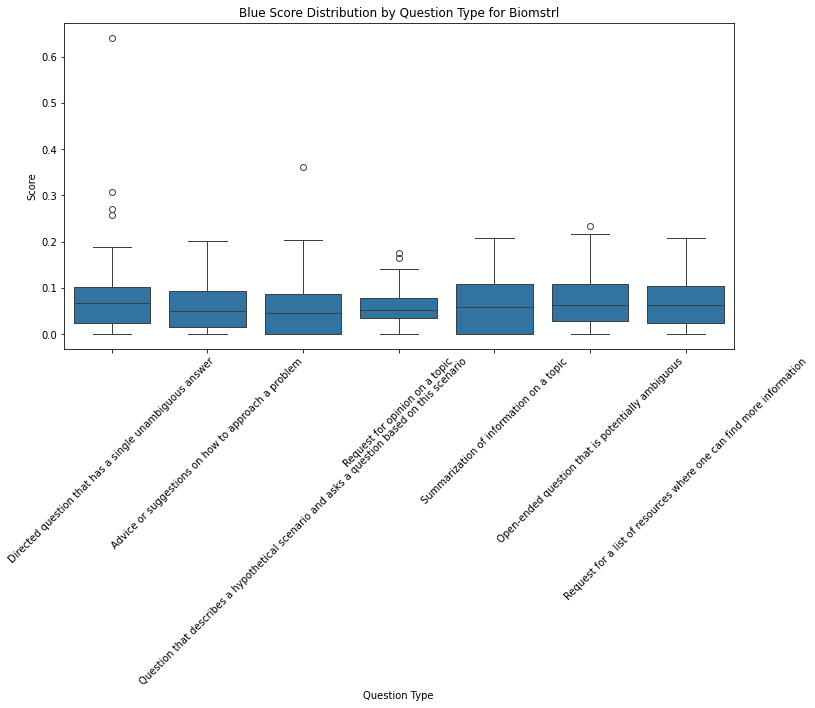

In [140]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='question_types', y='Scaled_Bleu_Score', data=biomstrl_with_qtype_exploded_df)
plt.title('Blue Score Distribution by Question Type for Biomstrl')
plt.xlabel('Question Type')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.show()

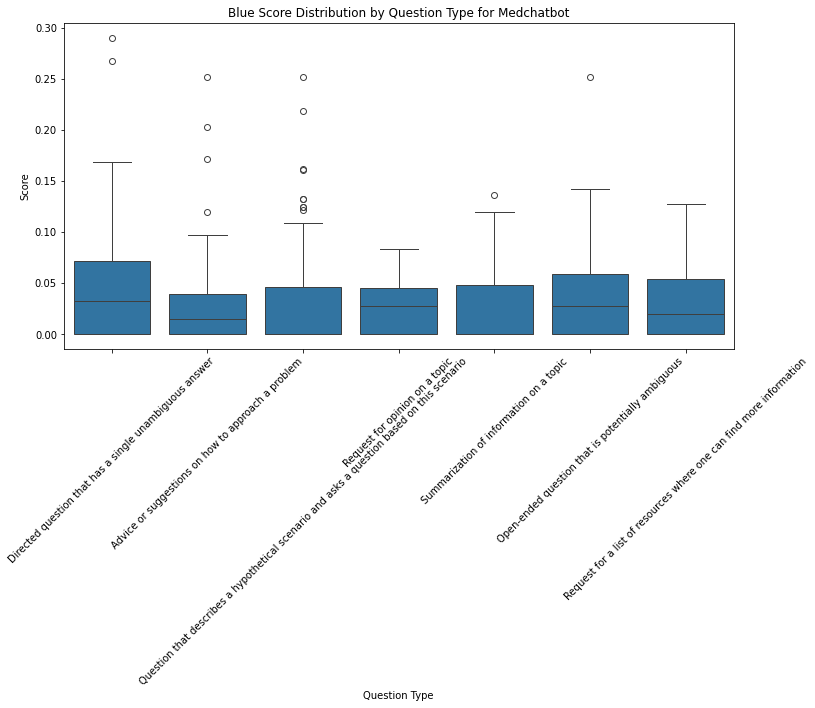

In [143]:
# Same thing for med chatbot
medchatbot_with_qtype_exploded_df = medchatbot_with_qtype.explode('question_types')

plt.figure(figsize=(12, 6))
sns.boxplot(x='question_types', y='Scaled_Bleu_Score', data=medchatbot_with_qtype_exploded_df)
plt.title('Blue Score Distribution by Question Type for Medchatbot')
plt.xlabel('Question Type')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.show()